### Extension: Estimate the maximal Lyapunov exponent (MLE)

We can extend the project by estimating the maximal Lyapunov exponent of the driven pendulum.
Mathematics: if two nearby trajectories have initial separation $\delta(0)$ and evolve to separation $\delta(t)$, the MLE is
$$\lambda = \lim_{t\to\infty} \frac{1}{t} \ln\frac{\|\delta(t)\|}{\|\delta(0)\|}. $$
A positive $\lambda$ indicates sensitive dependence on initial conditions (chaos). The code cell below implements a standard Benettin-style estimator: integrate two trajectories, periodically renormalise the separation and accumulate the growth rate. We then scan a parameter (e.g. forcing amplitude $\alpha$) to see where $\lambda$ becomes positive.

alpha=0.000, lambda≈-0.20000
alpha=0.208, lambda≈-0.19978
alpha=0.417, lambda≈-0.19927
alpha=0.625, lambda≈-0.08215
alpha=0.833, lambda≈-0.02852
alpha=1.042, lambda≈0.12048
alpha=1.250, lambda≈-0.05719
alpha=1.458, lambda≈-0.12244
alpha=1.667, lambda≈0.09939
alpha=1.875, lambda≈0.14230
alpha=2.083, lambda≈-0.12800
alpha=2.292, lambda≈-0.14763
alpha=2.500, lambda≈0.00121


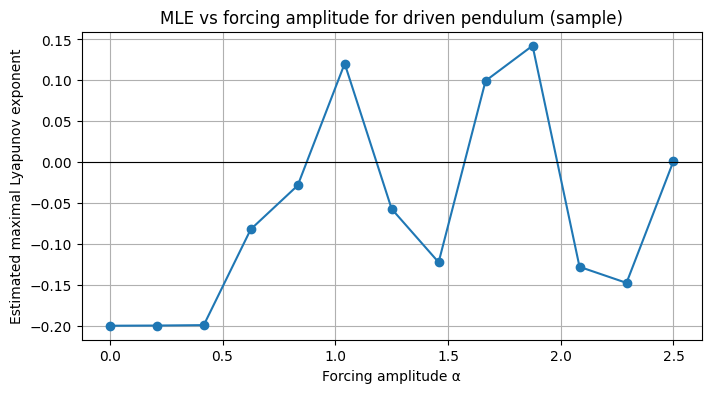

In [ ]:
def pendulum_system(t, y, gamma, omega, Omega, alpha):
    theta, eta = y
    return [eta, -2*gamma*eta - omega**2 * np.sin(theta) + alpha * np.cos(Omega * t)]

def estimate_lyapunov(gamma, omega, Omega, alpha, y0=(0.1,0.0), delta0=1e-8, t_max=500.0, dt_renorm=0.5):
    """Estimate maximal Lyapunov exponent using periodic renormalisation."""
    n_steps = int(np.ceil(t_max / dt_renorm))
    t = 0.0
    y = np.array(y0, dtype=float)
    # perturbed initial condition: small separation along theta direction
    y_pert = y + np.array([delta0, 0.0])
    sum_log = 0.0

    for i in range(n_steps):
        t_span = (t, t + dt_renorm)
        sol = sc.integrate.solve_ivp(lambda tt, yy: pendulum_system(tt, yy, gamma, omega, Omega, alpha), t_span, y, rtol=1e-8, atol=1e-8)
        sol_p = sc.integrate.solve_ivp(lambda tt, yy: pendulum_system(tt, yy, gamma, omega, Omega, alpha), t_span, y_pert, rtol=1e-8, atol=1e-8)
        y = sol.y[:, -1]
        y_pert = sol_p.y[:, -1]
        # separation vector and its norm
        delta = y_pert - y
        dist = np.linalg.norm(delta)
        if dist == 0 or np.isnan(dist):
            # numerical degenerate case; skip
            continue
        sum_log += np.log(dist / delta0)
        # renormalise perturbed state to be at distance delta0 from y along the same direction
        y_pert = y + (delta / dist) * delta0
        t += dt_renorm
    # return exponent per unit time
    lambda_est = sum_log / (n_steps * dt_renorm)
    return lambda_est

# Example: scan forcing amplitude alpha and plot MLE vs alpha
alphas = np.linspace(0.0, 2.5, 13)
lambdas = []
for a in alphas:
    le = estimate_lyapunov(gamma=0.2, omega=1.0, Omega=2/3, alpha=a, y0=(0.1,0.0), delta0=1e-8, t_max=300.0, dt_renorm=0.5)
    lambdas.append(le)
    print(f'alpha={a:.3f}, lambda≈{le:.5f}')

plt.figure(figsize=(8,4))
plt.plot(alphas, lambdas, '-o')
plt.axhline(0, color='k', lw=0.8)
plt.xlabel('Forcing amplitude α')
plt.ylabel('Estimated maximal Lyapunov exponent')
plt.title('MLE vs forcing amplitude for driven pendulum (sample)')
plt.grid(True)
plt.show()

With dots

In [ ]:
import numpy as np
import scipy.integrate as sc_int
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
plt.rcParams['animation.embed_limit'] = 100 


def animate_pendulum(gamma=1/5, omega=1, Omega=2/3, alpha=1.45, 
                     theta0=0.0, eta0=0.0, t_duration=30, fps=24, 
                     playback_speed=2.0, force_arrow_scale=0.3, transient_time=500.0,
                     skip_transient=False, show_strobe_dots=True):
    """
    Simulates and animates a forced pendulum with a driving force vector.
    Returns an HTML object that can be displayed interactively in a Jupyter Notebook.
    
    Parameters:
    - gamma, omega, Omega: Physical parameters of the system
    - alpha: Forcing amplitude. If float, remains constant and no transients are skipped. 
             If tuple (alpha1, alpha2), skips 'transient_time', shows alpha1 for 1/5 of t_duration, 
             then snaps to alpha2.
    - theta0, eta0: Initial conditions
    - t_duration: Duration of the visible animation in seconds
    - fps: Visual frames rendered per second of real viewing time
    - playback_speed: Multiplier for simulation speed
    - force_arrow_scale: Visual length multiplier for the driving force arrow
    - transient_time: Seconds to simulate silently before the animation starts (only if alpha is a tuple).
    """
    
    is_sweep = isinstance(alpha, (list, tuple))
    
    # If it's a sweep, start the animation at t=transient_time
    t0 = transient_time if skip_transient else 0.0
    t_end = t0 + t_duration

    # Calculate the driving force period (Stroboscopic sampling interval)
    T = 2 * np.pi / Omega
    flash_threshold = 0.1 * playback_speed
    
    # Helper to calculate the current alpha value based on simulation time
    def get_alpha(t):
        if is_sweep:
            # Switch at exactly 1/3 of the visible animation duration
            t_switch = t0 + (t_duration / 20.0)
            return alpha[0] if t < t_switch else alpha[1]
        return alpha
    
    # 1. Define the system of ODEs
    def system(t, y):
        theta, eta = y
        current_alpha = get_alpha(t)

        dtheta_dt = eta
        deta_dt = -2 * gamma * eta - omega**2 * np.sin(theta) + current_alpha * np.cos(Omega * t)
        return [dtheta_dt, deta_dt]
    
    # 2. Setup time evaluation array based on playback speed
    total_frames = int((t_duration * fps) / playback_speed)
    
    # We evaluate ONLY the times we want to animate (from t0 to t_end)
    t_eval = np.linspace(t0, t_end, total_frames)
    
    # 3. Solve the ODE from 0 to t_end. 
    # Because we pass t_eval, the solver silently blows past the transient period 
    # and only saves the frames we actually care about viewing!
    sol = sc_int.solve_ivp(
        system, 
        (0, t_end), 
        [theta0, eta0], 
        t_eval=t_eval, 
        method='RK45', 
        rtol=1e-6, 
        atol=1e-6
    )
    
    theta = sol.y[0]
    # 4. Convert polar coordinates to Cartesian for plotting (Length L = 1)
    x = np.sin(theta)
    y = -np.cos(theta)

    # Pre-calculate the stroboscopic dots from the existing frames
    # This prevents duplicate dot glitches if the user scrubs backwards in the video player
    strobe_xs = []
    strobe_ys = []
    strobe_frames = []
    
    if show_strobe_dots:
        n_start = int(np.ceil(t0 / T))
        n_end = int(np.floor(t_end / T))
        for n in range(n_start, n_end + 1):
            target_time = n * T
            # Find the frame index whose time is closest to the exact multiple of T
            idx = np.argmin(np.abs(t_eval - target_time))
            strobe_frames.append(idx)
            strobe_xs.append(x[idx])
            strobe_ys.append(y[idx])
    strobe_frames = np.array(strobe_frames)
    strobe_xs = np.array(strobe_xs)
    strobe_ys = np.array(strobe_ys)
    

    # 5. Set up plot
    fig, ax = plt.subplots(figsize=(6, 6))
    
    max_alpha = max(alpha) if is_sweep else alpha
    limit = 1.15 + (max_alpha * force_arrow_scale)
    ax.set_xlim(-limit, limit)
    ax.set_ylim(-limit, limit)
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    
    title_str = f"Catastrophe Jump: {alpha[0]} -> {alpha[1]}" if is_sweep else f"{alpha}"
    ax.set_title(f'Forced Pendulum ($\\alpha$={title_str})')
    
    ax.plot([0], [0], 'ko', markersize=4)
    
    # Initialise plot elements
    strobe_dots, = ax.plot([], [], 'ro', markersize=8, alpha=0.6, zorder=2)
    rod, = ax.plot([], [], '-', lw=3, color='royalblue', zorder=3)
    bob, = ax.plot([], [], 'o', markersize=15, color='darkorange', zorder=4)
    info_text = ax.text(0.05, 0.92, '', transform=ax.transAxes, fontsize=12, fontfamily='monospace')
    force_arrow = ax.quiver(0, 0, 0, 0, color='crimson', scale=1, scale_units='xy', 
                            angles='xy', width=0.012, pivot='tail', zorder=5)
    

    # Initialise animation
    def init():
        rod.set_data([], [])
        bob.set_data([], [])
        info_text.set_text('')
        force_arrow.set_offsets(np.array([[0, 0]]))
        force_arrow.set_UVC(0, 0)
        strobe_dots.set_data([], [])
        return rod, bob, info_text, force_arrow
    
    # Tells animator how to update to next frame
    def update(frame):
        t = t_eval[frame]
        th = theta[frame]
        current_alpha = get_alpha(t)
        
        rod.set_data([0, x[frame]], [0, y[frame]])
        bob.set_data([x[frame]], [y[frame]])
        
        # Check if the current time is close to a multiple of T
        # round(t / T) * T gives us the exact nearest multiple of T
        distance_to_T = abs(t - round(t / T) * T)
        
        if distance_to_T < flash_threshold:
            info_text.set_color('red')
            info_text.set_fontweight('bold')
        else:
            info_text.set_color('black')
            info_text.set_fontweight('normal')
            
        info_text.set_text(f'Time: {t:05.1f}s | α: {current_alpha:.4f}')
        
        F_drive = current_alpha * np.cos(Omega * t)
        u = F_drive * np.cos(th) * force_arrow_scale
        v = F_drive * np.sin(th) * force_arrow_scale
        
        force_arrow.set_offsets(np.array([[x[frame], y[frame]]]))
        force_arrow.set_UVC(u, v)

        # Update stroboscopic dots
        if show_strobe_dots and len(strobe_frames) > 0:
            # Tell the plot to draw all dots that belong to a frame index <= the current frame
            valid_idx = strobe_frames <= frame
            strobe_dots.set_data(strobe_xs[valid_idx], strobe_ys[valid_idx])
        
        return rod, bob, info_text, force_arrow
    

    # 6. Create the animation
    ani = FuncAnimation(fig, update, frames=len(t_eval), 
                        init_func=init, blit=True, interval=1000/fps)
    
    plt.close(fig)
    return HTML(ani.to_jshtml())


display(animate_pendulum(alpha=1.056, t_duration=300, playback_speed=8.0, skip_transient=True))

In [3]:
import numpy as np
import scipy.integrate as sc_int
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
from scipy.interpolate import interp1d  # Added for more robust interpolation
def animate_pendulum(gamma=1/5, omega=1, Omega=2/3, alpha=1.45, 
                     theta0=0.0, eta0=0.0, t_duration=30, fps=30, 
                     playback_speed=2.0, force_scale=0.3, transient_time=500.0,
                     show_strobe_dots=True):
    
    is_sweep = isinstance(alpha, (list, tuple))
    t0 = transient_time if is_sweep else 0.0
    t_end = t0 + t_duration
    T = 2 * np.pi / Omega
    
    def get_alpha(t):
        if is_sweep:
            t_switch = t0 + (t_duration / 3.0)
            return alpha[0] if t < t_switch else alpha[1]
        return alpha
    
    def system(t, y):
        theta, eta = y
        dtheta_dt = eta
        current_alpha = get_alpha(t)
        deta_dt = -2 * gamma * eta - omega**2 * np.sin(theta) + current_alpha * np.cos(Omega * t)
        return [dtheta_dt, deta_dt]
    
    total_frames = int((t_duration * fps) / playback_speed)
    t_eval = np.linspace(t0, t_end, total_frames)
    
    # Solve the ODE
    sol = sc_int.solve_ivp(
        system, 
        (0, t_end), 
        [theta0, eta0], 
        t_eval=t_eval, 
        method='RK45', 
        rtol=1e-6, 
        atol=1e-6
    )
    
    theta = sol.y[0]
    x = np.sin(theta)
    y = -np.cos(theta)
    
    # Calculate stroboscopic points using interp1d for better compatibility
    if show_strobe_dots:
        n_start = int(np.ceil(t0 / T))
        n_end = int(np.floor(t_end / T))
        if n_end >= n_start:
            strobe_times = np.arange(n_start, n_end + 1) * T
            
            # Manually create the interpolant from the solved points
            interp_func = interp1d(sol.t, sol.y[0], kind='cubic', fill_value="extrapolate")
            strobe_thetas = interp_func(strobe_times)
            
            strobe_xs = np.sin(strobe_thetas)
            strobe_ys = -np.cos(strobe_thetas)
        else:
            strobe_times = np.array([])
    else:
        strobe_times = np.array([])
    
    # [Rest of the animation plotting code remains the same]
    fig, ax = plt.subplots(figsize=(6, 6))
    max_alpha = max(alpha) if is_sweep else alpha
    limit = 1.15 + (max_alpha * force_scale)
    ax.set_xlim(-limit, limit)
    ax.set_ylim(-limit, limit)
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    title_str = f"Catastrophe Jump: {alpha[0]} -> {alpha[1]}" if is_sweep else f"{alpha}"
    ax.set_title(f'Forced Pendulum ($\\alpha$={title_str})')
    ax.plot([0], [0], 'ko', markersize=4)
    
    strobe_dots, = ax.plot([], [], 'ro', markersize=8, alpha=0.6, zorder=2)
    rod, = ax.plot([], [], '-', lw=3, color='royalblue', zorder=3)
    bob, = ax.plot([], [], 'o', markersize=15, color='darkorange', zorder=4)
    info_text = ax.text(0.05, 0.92, '', transform=ax.transAxes, fontsize=12, fontfamily='monospace')
    force_arrow = ax.quiver(0, 0, 0, 0, color='crimson', scale=1, scale_units='xy', 
                            angles='xy', width=0.012, pivot='tail', zorder=5)
    
    def init():
        rod.set_data([], [])
        bob.set_data([], [])
        info_text.set_text('')
        force_arrow.set_offsets(np.array([[0, 0]]))
        force_arrow.set_UVC(0, 0)
        strobe_dots.set_data([], [])
        return rod, bob, info_text, force_arrow, strobe_dots
    flash_threshold = 0.1 * playback_speed
    def update(frame):
        t = t_eval[frame]
        th = theta[frame]
        current_alpha = get_alpha(t)
        rod.set_data([0, x[frame]], [0, y[frame]])
        bob.set_data([x[frame]], [y[frame]])
        
        dist = abs(t - round(t / T) * T)
        if dist < flash_threshold:
            info_text.set_color('red')
            info_text.set_fontweight('bold')
        else:
            info_text.set_color('black')
            info_text.set_fontweight('normal')
            
        info_text.set_text(f'Time: {t:05.1f}s | α: {current_alpha:.4f}')
        F_drive = current_alpha * np.cos(Omega * t)
        u = F_drive * np.cos(th) * force_scale
        v = F_drive * np.sin(th) * force_scale
        force_arrow.set_offsets(np.array([[x[frame], y[frame]]]))
        force_arrow.set_UVC(u, v)
        
        if show_strobe_dots and len(strobe_times) > 0:
            valid_idx = strobe_times <= t
            if np.any(valid_idx):
                strobe_dots.set_data(strobe_xs[valid_idx], strobe_ys[valid_idx])
        return rod, bob, info_text, force_arrow, strobe_dots
    ani = FuncAnimation(fig, update, frames=len(t_eval), 
                        init_func=init, blit=True, interval=1000/fps)
    plt.close(fig)
    return HTML(ani.to_jshtml())



animate_pendulum(alpha=1.056, t_duration=60, playback_speed=4.0)

In [ ]:
import numpy as np
import scipy.integrate as sc_int
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display


def animate_pendulum(gamma=1/5, omega=1, Omega=2/3, alpha=1.45, 
                     theta0=0.0, eta0=0.0, t_duration=30, fps=30, 
                     playback_speed=2.0, force_arrow_scale=0.3, transient_time=500.0,
                     show_strobe_dots=True, skip_transient=True):
    """
    Simulates and animates a forced pendulum with a driving force vector.
    Returns an HTML object that can be displayed interactively in a Jupyter Notebook.
    
    :param gamma: Damping coefficient
    :param omega: Natural frequency of the pendulum
    :param Omega: Driving frequency
    :param alpha: Forcing amplitude. If float, remains constant and no transients are skipped. 
             If tuple (alpha1, alpha2),  shows alpha1 for 1/10 of t_duration, then snaps to alpha2.
    :param theta0, eta0: Initial conditions
    :param t_duration: Duration of the visible animation in seconds
    :param fps: Visual frames rendered per second of real viewing time
    :param playback_speed: Multiplier for simulation speed
    :param force_arrow_scale: Visual length multiplier for the driving force arrow
    :param transient_time: Seconds to simulate silently before the animation starts (only if alpha is a tuple).
    :param show_strobe_dots: Whether to display stroboscopic dots
    :param skip_transient: Skips first transient_time seconds of simulation if True. 
    """
    # Stores if we are to change alpha part way though animation
    is_sweep = isinstance(alpha, (list, tuple))

    # Calculate some time values
    t0 = transient_time if skip_transient else 0.0
    t_end = t0 + t_duration
    T = 2 * np.pi / Omega
    flash_threshold = 0.1 * playback_speed
    

    # Helper to calculate the current alpha value based on simulation time
    def get_alpha(t):
        if is_sweep:
            t_switch = t0 + (t_duration / 10.0)
            return alpha[0] if t < t_switch else alpha[1]
        return alpha
    
    # Define the system of ODEs
    def system(t, y):
        theta, eta = y
        dtheta_dt = eta
        deta_dt = -2 * gamma * eta - omega**2 * np.sin(theta) + get_alpha(t) * np.cos(Omega * t)
        return [dtheta_dt, deta_dt]
    

    # --- Solve 1: For the continuous animation frames ---
    total_frames = int((t_duration * fps) / playback_speed)
    t_eval_frames = np.linspace(t0, t_end, total_frames)
    
    sol_frames = sc_int.solve_ivp(
        system, 
        (0, t_end), 
        [theta0, eta0], 
        t_eval=t_eval_frames, 
        method='RK45', 
        rtol=1e-8,  # Bumped up to 1e-8 to perfectly match your stroboscopic function!
        atol=1e-8
    )
    theta_frames = sol_frames.y[0]
    x_frames = np.sin(theta_frames)
    y_frames = -np.cos(theta_frames)
    
    # --- Solve 2: For the exact stroboscopic dots ---
    # This is required for precision. 
    strobe_times = np.array([])
    strobe_xs = np.array([])
    strobe_ys = np.array([])
    
    if show_strobe_dots:
        n_start = int(np.ceil(t0 / T))
        n_end = int(np.floor(t_end / T))
        if n_end >= n_start:
            # Tell the solver to evaluate exactly at the multiples of T
            t_eval_strobe = np.arange(n_start, n_end + 1) * T
            sol_strobe = sc_int.solve_ivp(
                system, 
                (0, t_end), 
                [theta0, eta0], 
                t_eval=t_eval_strobe, 
                method='RK45', 
                rtol=1e-8, 
                atol=1e-8
            )
            theta_strobe = sol_strobe.y[0]
            strobe_xs = np.sin(theta_strobe)
            strobe_ys = -np.cos(theta_strobe)
            strobe_times = t_eval_strobe


    # --- Setup Plot ---
    fig, ax = plt.subplots(figsize=(5, 5))
    plt.tight_layout(rect=[0, -0.3, 1, 1.23], h_pad=0.2)

    max_alpha = max(alpha) if is_sweep else alpha
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.5, 1.5)
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    
    title_str = f"Parameter change: {alpha[0]} -> {alpha[1]}" if is_sweep else f"{alpha}" + \
    f"\n Parameters: gamma={gamma:.2f}, omega={omega:.2f}, Omega={Omega:.2f}"

    ax.set_title(f'Forced Pendulum ($\\alpha$={title_str})')
    ax.plot([0], [0], 'ko', markersize=4)
    
    # Plot features
    strobe_dots, = ax.plot([], [], 'ro', markersize=8, alpha=0.6, zorder=2)
    rod, = ax.plot([], [], '-', lw=3, color='royalblue', zorder=3)
    bob, = ax.plot([], [], 'o', markersize=15, color='darkorange', zorder=4)
    info_text = ax.text(0.05, 0.92, '', transform=ax.transAxes, fontsize=12, fontfamily='monospace')
    force_arrow = ax.quiver(0, 0, 0, 0, color='crimson', scale=1, scale_units='xy', 
                            angles='xy', width=0.012, pivot='tail', zorder=5)
    
    # Initialise animation features.
    def init():
        rod.set_data([], [])
        bob.set_data([], [])
        info_text.set_text('')
        force_arrow.set_offsets(np.array([[0, 0]]))
        force_arrow.set_UVC(0, 0)
        strobe_dots.set_data([], [])
        return rod, bob, info_text, force_arrow, strobe_dots
    
    # Tells animator how to update to next frame.
    def update(frame):
        t = t_eval_frames[frame]
        th = theta_frames[frame]
        current_alpha = get_alpha(t)
        
        # Set rod and bob position
        rod.set_data([0, x_frames[frame]], [0, y_frames[frame]])
        bob.set_data([x_frames[frame]], [y_frames[frame]])
        
        # Flash text logic
        dist = abs(t - round(t / T) * T)
        if dist < flash_threshold:
            info_text.set_color('red')
            info_text.set_fontweight('bold')
        else:
            info_text.set_color('black')
            info_text.set_fontweight('normal')
            
        info_text.set_text(f'Time: {t:05.1f}s | α: {current_alpha:.4f}')
        
        # Arrow logic
        F_drive = current_alpha * np.cos(Omega * t)
        u = F_drive * np.cos(th) * force_arrow_scale
        v = F_drive * np.sin(th) * force_arrow_scale
        force_arrow.set_offsets(np.array([[x_frames[frame], y_frames[frame]]]))
        force_arrow.set_UVC(u, v)
        
        # Exact Stroboscopic dots logic
        if show_strobe_dots and len(strobe_times) > 0:
            valid_idx = strobe_times <= t
            strobe_dots.set_data(strobe_xs[valid_idx], strobe_ys[valid_idx])
            
        return rod, bob, info_text, force_arrow, strobe_dots
    

    ani = FuncAnimation(fig, update, frames=len(t_eval_frames), 
                        init_func=init, blit=True, interval=1000/fps)
    ani.save('my_animation.gif', writer='pillow', fps=24)
    plt.close(fig)


    return HTML(ani.to_jshtml())


display(animate_pendulum(alpha=1.286, t_duration=10, playback_speed=8.0))